In [1]:
%run setup.ipynb
rcParams['figure.dpi'] = 120
rcParams['figure.facecolor'] = 'w'

In [2]:
callset_pass = phase1_ar31.callset_pass

In [3]:
allele_counts = phase1_ar3.allele_counts

In [4]:
list(allele_counts['2R'])

['AOM',
 'BFM',
 'BFS',
 'CMS',
 'GAS',
 'GNS',
 'GWA',
 'KES',
 'UGS',
 'all',
 'all_m',
 'all_s']

In [34]:
@functools.lru_cache(maxsize=None)
def pbs(seqid, pop1, pop2, pop3, window_size, min_maf=0.02):
    
    # load variant positions
    pos = callset_pass[seqid]['variants/POS'][:]
    
    # load allele counts
    ac1 = allel.AlleleCountsArray(allele_counts[seqid][pop1])
    ac2 = allel.AlleleCountsArray(allele_counts[seqid][pop2])
    ac3 = allel.AlleleCountsArray(allele_counts[seqid][pop3])
    
    # locate segregating variants at sufficient frequency
    ac = ac1 + ac2 + ac3
    loc_seg = ac.is_biallelic_01() & (ac.to_frequencies()[:, :2].min(axis=1) > min_maf)
    pos = pos[loc_seg]
    ac1 = ac1[loc_seg]
    ac2 = ac2[loc_seg]
    ac3 = ac3[loc_seg]

    # setup windows
    starts = allel.moving_statistic(pos, statistic=lambda v: v[0], size=window_size)
    starts[0] = 1  # fix to start of sequence
    ends = np.append(starts[1:] - 1, [len(genome[seqid])])

    # compute fst
    fst12 = allel.moving_hudson_fst(ac1, ac2, size=window_size)
    fst13 = allel.moving_hudson_fst(ac1, ac3, size=window_size)
    fst23 = allel.moving_hudson_fst(ac2,ac3, size=window_size)
    
    # compute fst transform
    t12 = -np.log10(1 - fst12)
    t13 = -np.log10(1 - fst13)
    t23 = -np.log10(1 - fst23)
    
    # compute pbs normalising constant
    norm = 1 + (t12 + t13 + t23) / 2
    
    # compute pbs
    pbsn1 = ((t12 + t13 - t23) / 2) / norm
    
    return starts, ends, pbsn1


In [51]:
def inspect_pbs(pop1, pop2, pop3, window_size=100, min_maf=0.02):

    for seqid in seqids:
        starts, ends, y = pbs(seqid, pop1, pop2, pop3, window_size=window_size, min_maf=min_maf)
        print(seqid, starts.shape)
        fig, ax = plt.subplots(figsize=(16 * len(genome[seqid]) / len(genome['2R']), 4))
        x = (starts + ends) / 2
        ax.plot(x, y, marker='o', linestyle=' ', mfc='none', mec='k', mew=.5, markersize=2)
        ax.set_xlabel('{} position (bp)'.format(seqid))
        ax.set_title('{} (versus {}, {})'.format(pop1, pop2, pop3));

2R (18249,)
2L (12309,)
3R (14509,)
3L (10172,)
X (4145,)


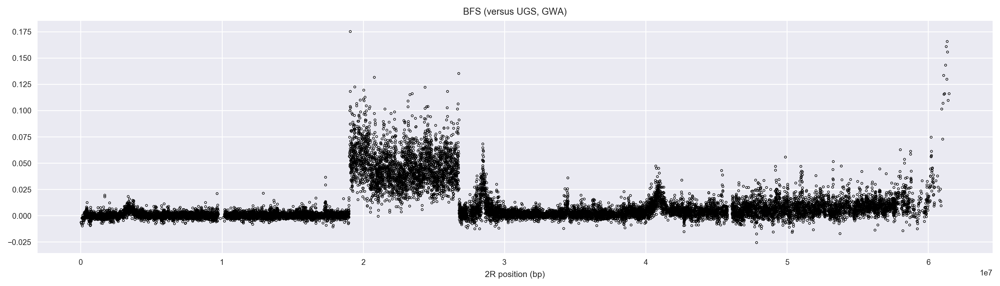

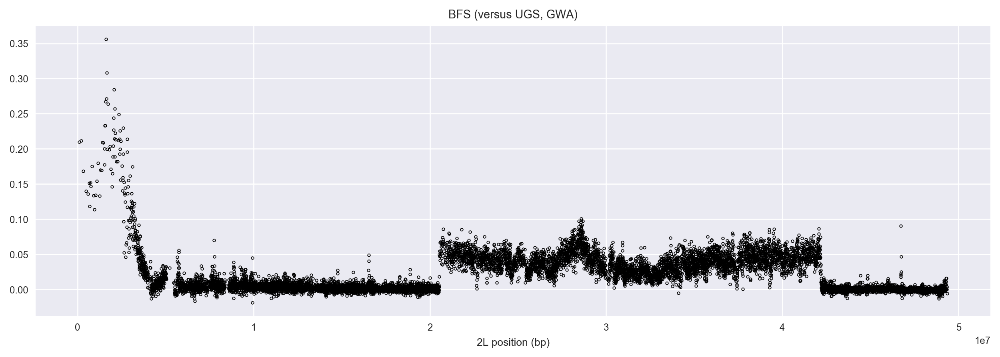

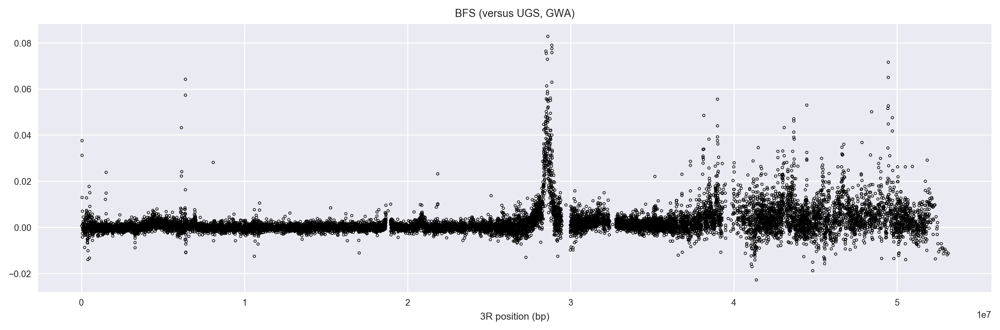

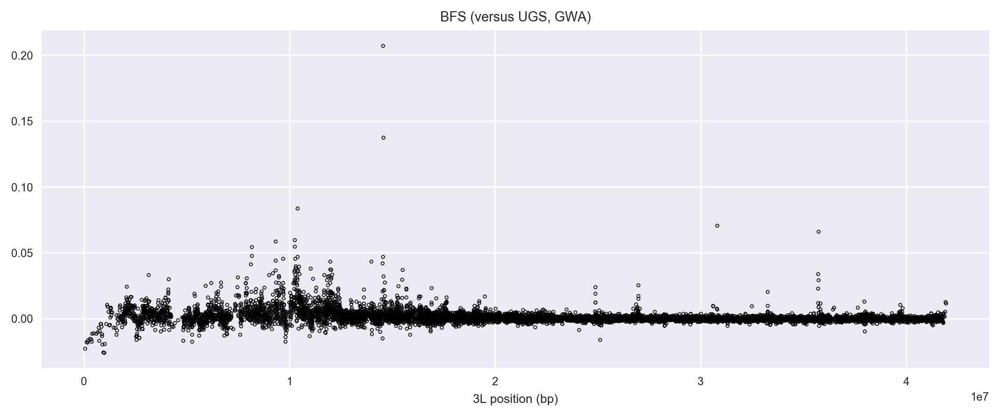

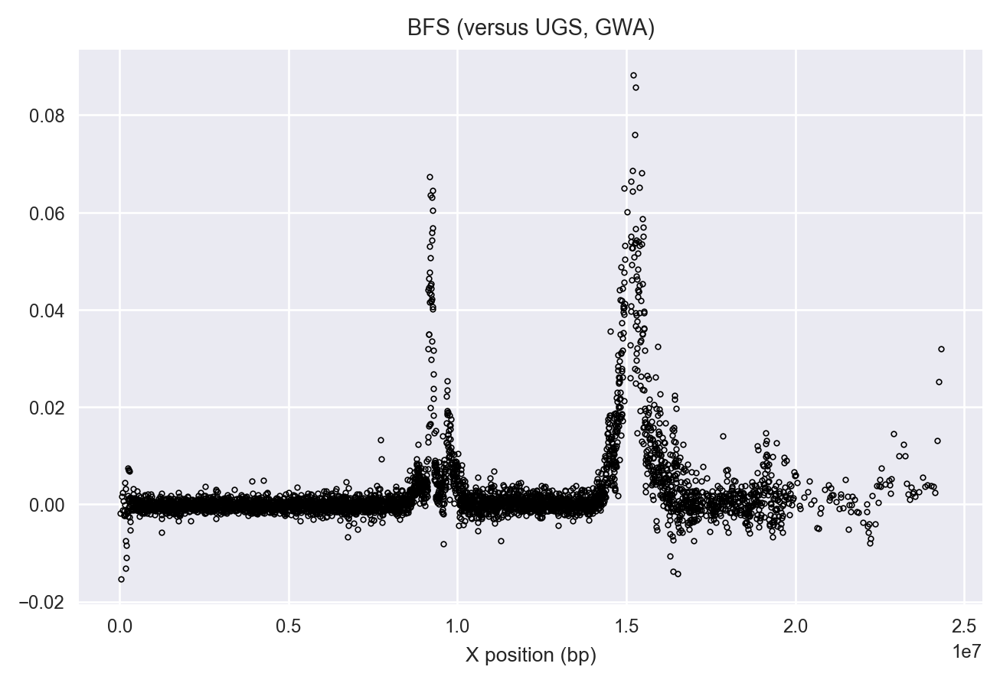

In [52]:
inspect_pbs('BFS', 'UGS', 'GWA')

2R (18249,)
2L (12309,)
3R (14509,)
3L (10172,)
X (4145,)


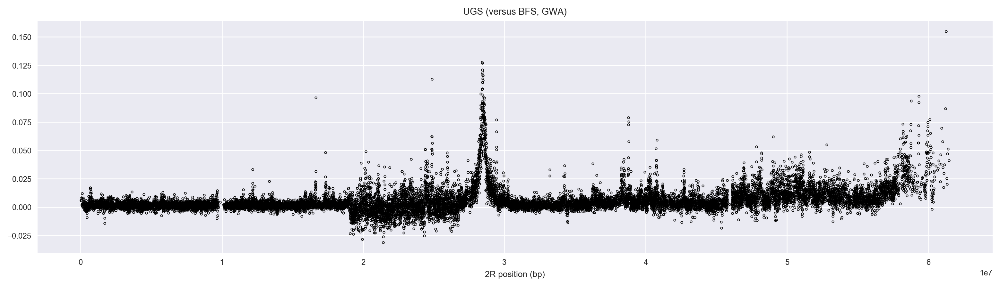

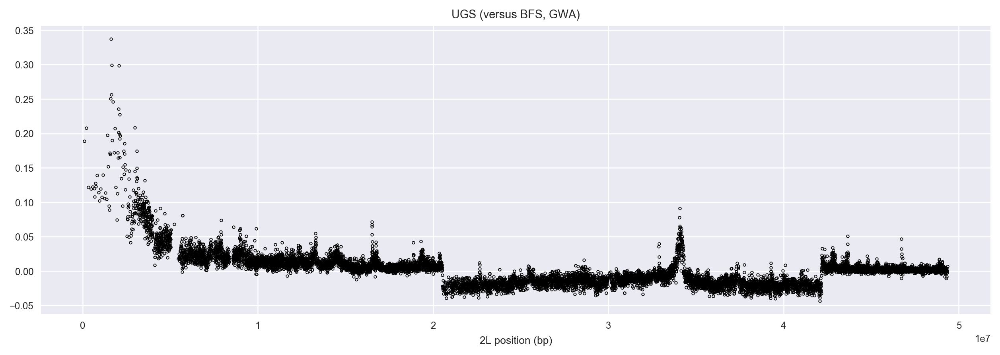

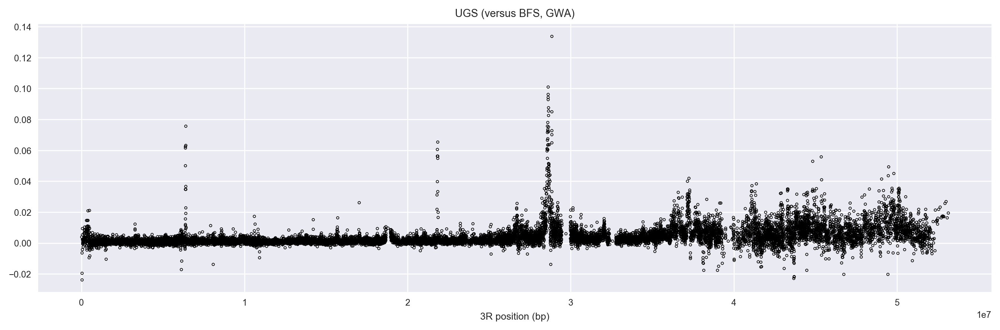

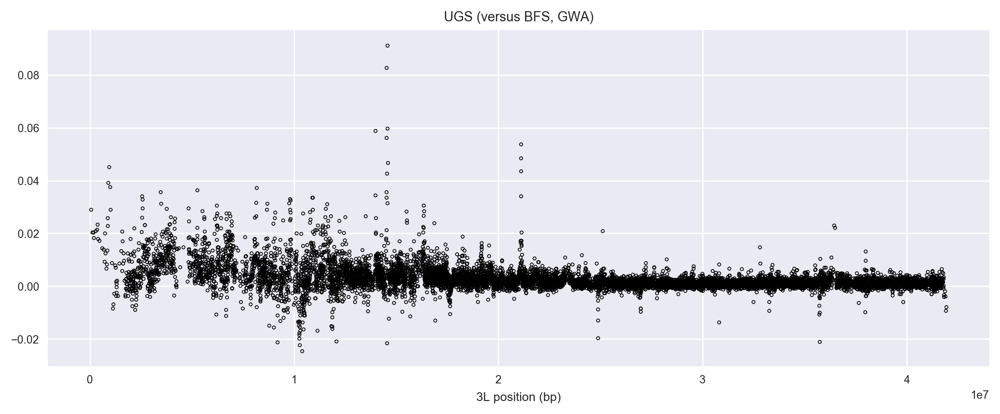

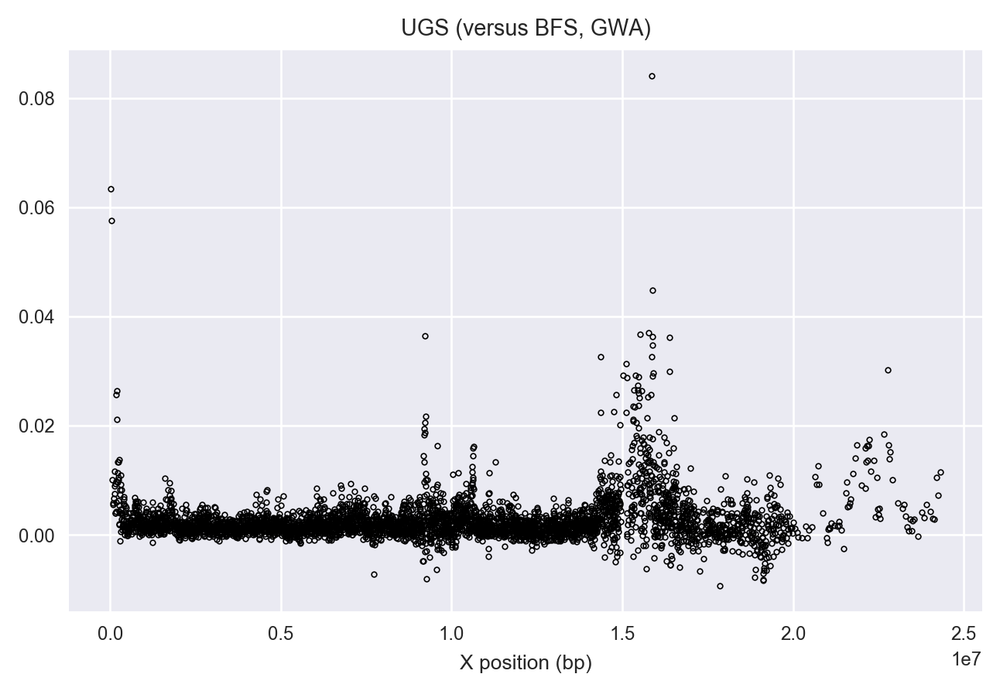

In [53]:
inspect_pbs('UGS', 'BFS', 'GWA')

2R (17199,)
2L (11877,)
3R (14220,)
3L (10310,)
X (4647,)


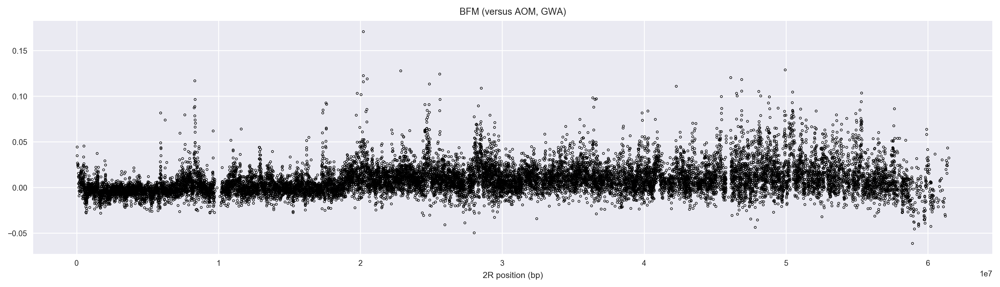

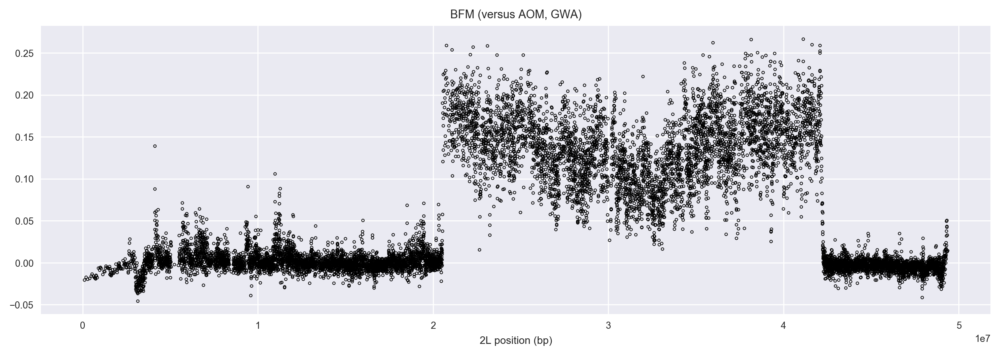

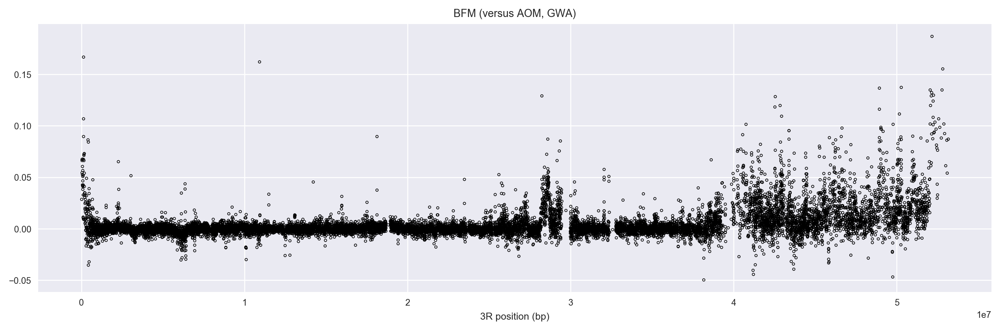

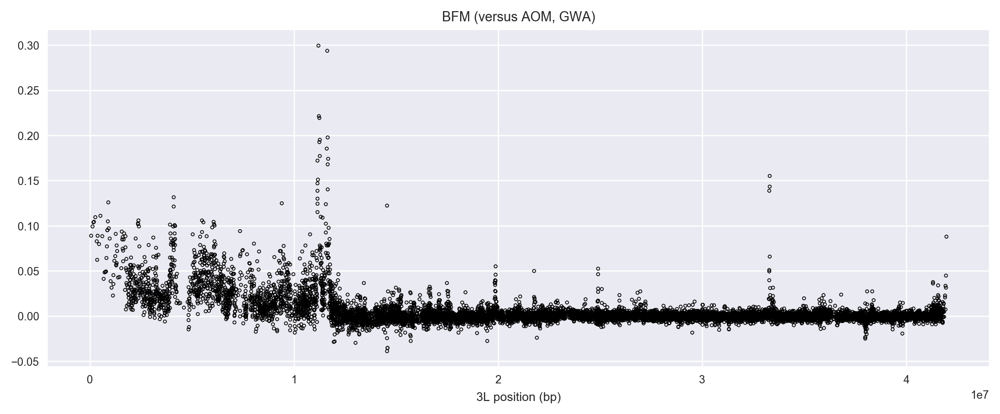

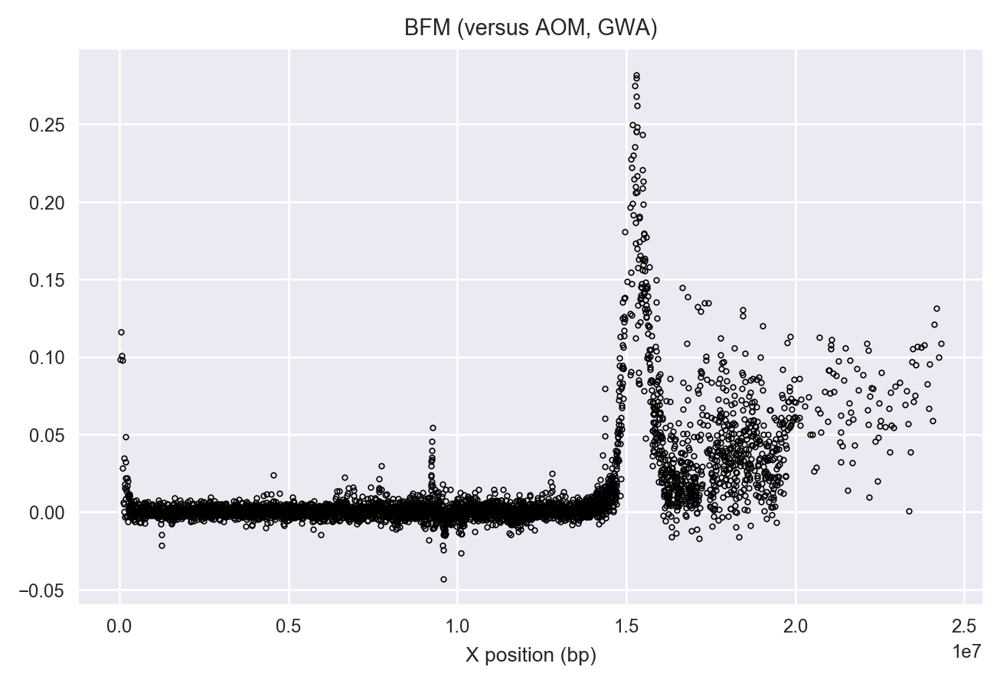

In [55]:
inspect_pbs('BFM', 'AOM', 'GWA')

2R (19445,)
2L (13039,)
3R (15831,)
3L (11293,)
X (4409,)


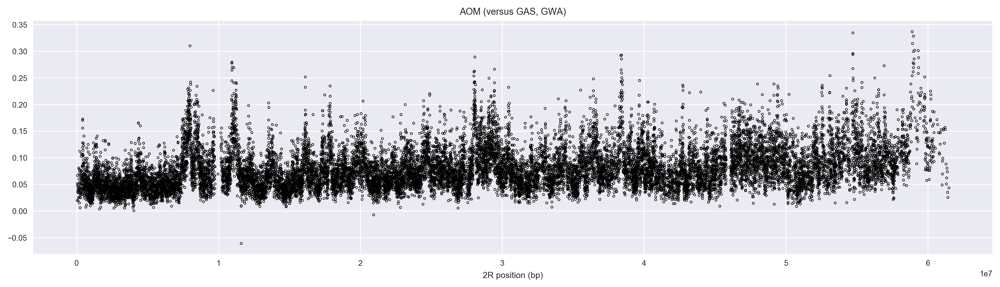

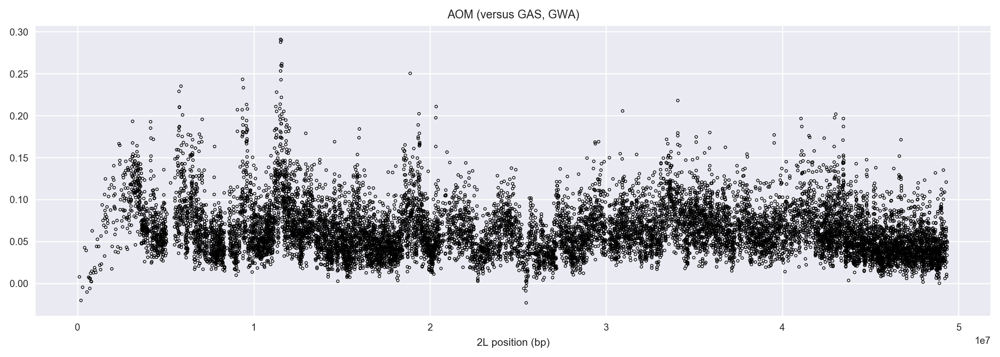

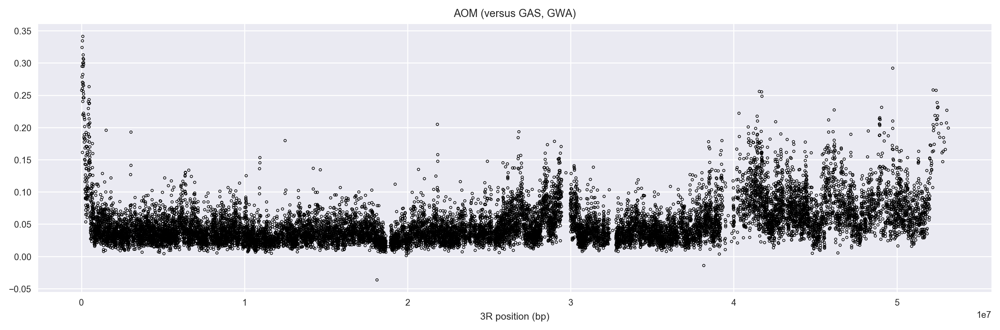

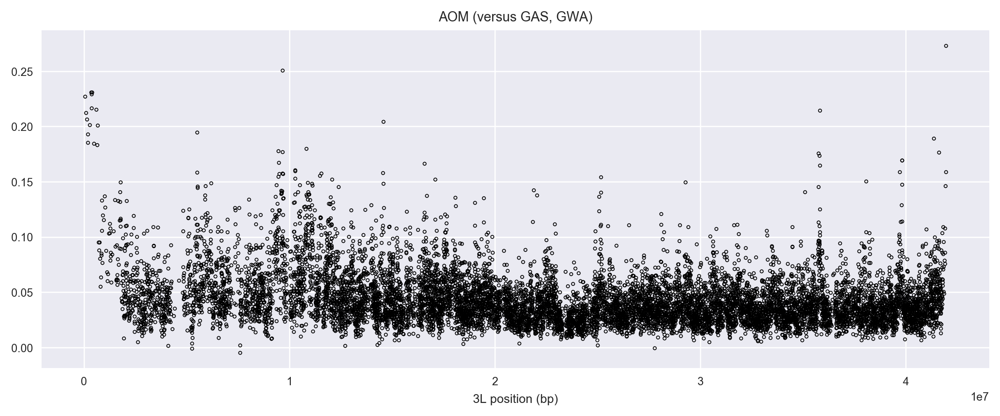

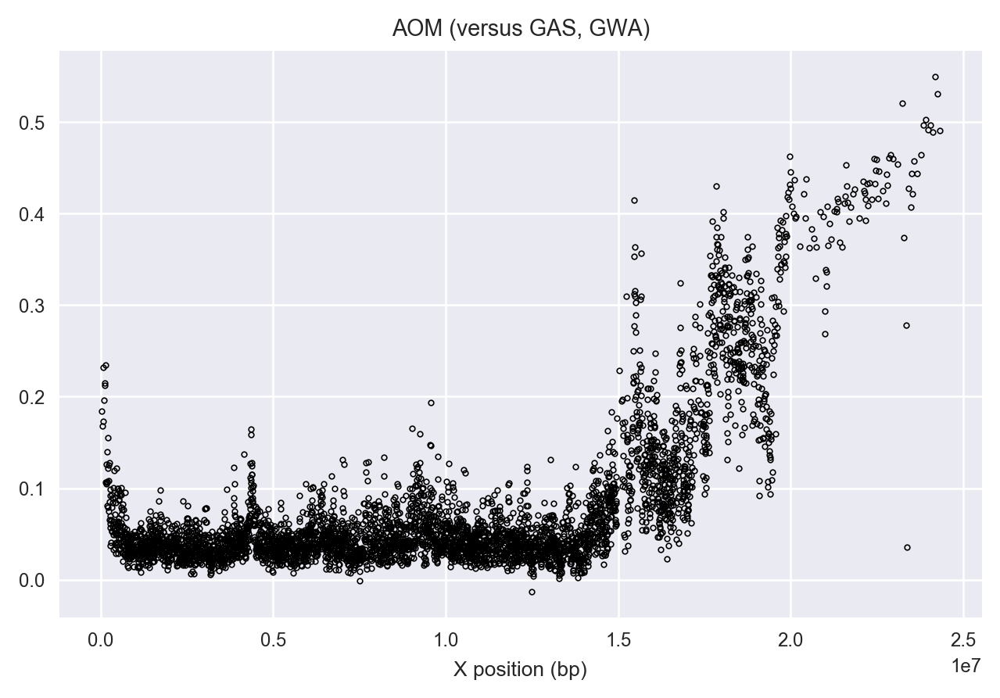

In [57]:
inspect_pbs('AOM', 'GAS', 'GWA')

2R (17840,)
2L (12136,)
3R (14087,)
3L (9916,)
X (3967,)


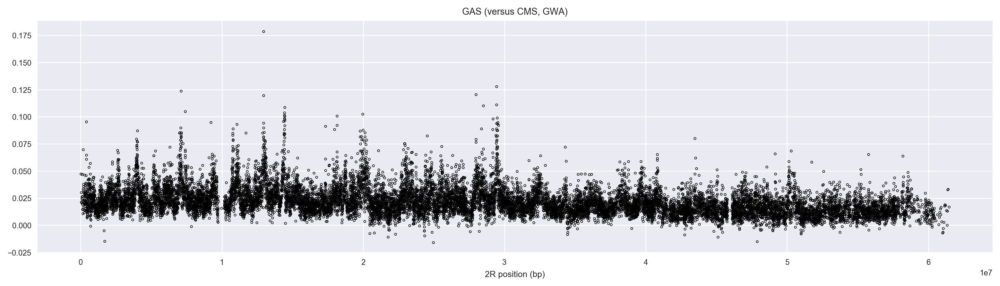

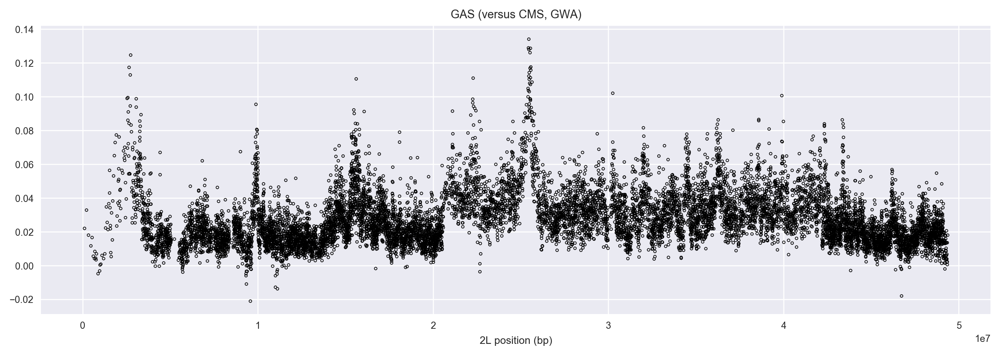

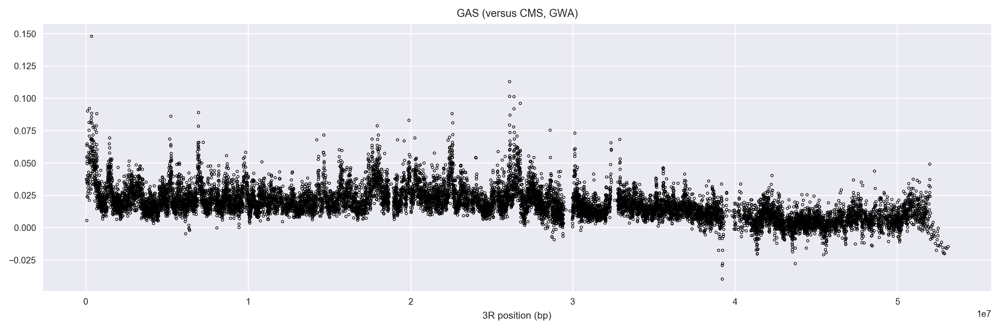

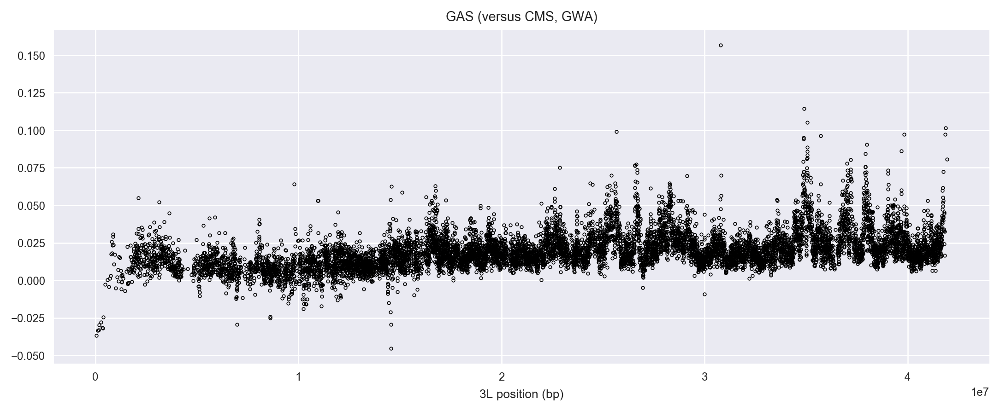

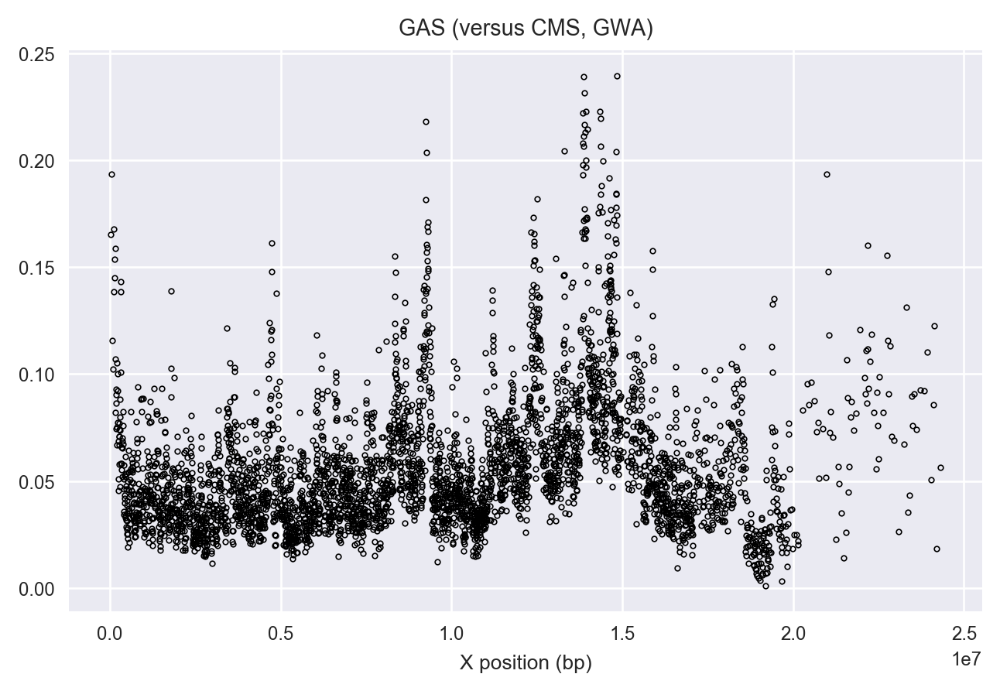

In [58]:
inspect_pbs('GAS', 'CMS', 'GWA')

In [65]:
np.searchsorted?

In [99]:
@functools.lru_cache(maxsize=None)
def build_dataframe(pop1, pop2, pop3, seqid=None, window_size=100, min_maf=0.05):
    
    if seqid is None:
        df = pd.concat([build_dataframe(pop1, pop2, pop3, seqid=seqid, window_size=window_size, min_maf=min_maf) 
                        for seqid in seqids])
        return df

    # extract whole genome raw values for percentile calculation
    values_wg = np.concatenate([
        pbs(seqid, pop1, pop2, pop3, window_size=window_size, min_maf=min_maf)[2] for seqid in seqids
    ])
    values_wg.sort()

    # extract values for seqid
    starts_col, ends_col, values_col = pbs(seqid, pop1, pop2, pop3, window_size=window_size, min_maf=min_maf)
    
    # compute percentiles
#     percentiles_col = [scipy.stats.percentileofscore(values_wg, v) for v in values_col]
    percentiles_col = np.searchsorted(values_wg, values_col) * 100 / values_wg.shape[0]
    
    # seqid column
    seqid_col = np.array([seqid] * len(starts_col))
    
    # build dataframe
    df = pd.DataFrame.from_items([
        ('seqid', seqid_col), 
        ('start', starts_col), 
        ('end', ends_col), 
        ('value', values_col),
        ('percentile', percentiles_col)
    ])
    return df


In [100]:
amplitude = lmfit.Parameter(value=0.2, vary=True, min=0)
decay = lmfit.Parameter(value=1, vary=True, min=0.05, max=4)
sigma = lmfit.Parameter(value=1, vary=True, min=0.05, max=4)
skew = lmfit.Parameter(value=0, vary=True, min=-2, max=2)
baseline = lmfit.Parameter(value=0, vary=True)
no_ceiling = lmfit.Parameter(value=1, vary=False)
floor = lmfit.Parameter(value=-1, vary=False)
null = lmfit.Parameter(value=0, vary=True)
peak_limit_frc = .2

exp_fitter = peakfit.ExponentialPeakFitter(
    amplitude=amplitude,
    decay=decay,
    baseline=baseline,
    ceiling=no_ceiling,
    floor=floor,
    null=null,
    peak_limit_frc=peak_limit_frc,
)


skewed_exp_fitter = peakfit.SkewedExponentialPeakFitter(
    amplitude=amplitude,
    decay=decay,
    skew=skew,
    baseline=baseline,
    ceiling=no_ceiling,
    floor=floor,
    null=null,
    peak_limit_frc=peak_limit_frc,
)


gauss_fitter = peakfit.GaussianPeakFitter(
    amplitude=amplitude,
    sigma=sigma,
    baseline=baseline,
    ceiling=no_ceiling,
    floor=floor,
    null=null,
    peak_limit_frc=peak_limit_frc,
)


skewed_gauss_fitter = peakfit.SkewedGaussianPeakFitter(
    amplitude=amplitude,
    sigma=sigma,
    skew=skew,
    baseline=baseline,
    ceiling=no_ceiling,
    floor=floor,
    null=null,
    peak_limit_frc=peak_limit_frc,
)


def inspect_peak_fits(center, flank):

    x = ((starts + ends) / 2).astype(int)
    x = gmap['2'].take(x - 1)
    y = values

    fit = skewed_exp_fitter.fit(x, y, center, flank)
    fig = peakfit.plot_peak_fit(fit, ylabel='PBS')
    fig.suptitle('Skewed Exponential', fontsize=12, fontweight='bold', y=1.03)
    plt.show()
    print(fit.peak_result.fit_report())
    
    fit = skewed_gauss_fitter.fit(x, y, center, flank)
    fig = peakfit.plot_peak_fit(fit, ylabel='PBS')
    fig.suptitle('Skewed Gaussian', fontsize=12, fontweight='bold', y=1.03)
    plt.show()
    print(fit.peak_result.fit_report())

    

In [101]:
df = build_dataframe('BFS', 'UGS', 'GWA')

In [102]:
df.head()

,seqid,start,end,value,percentile
0,2R,1,40603,-0.006877,0.751449
1,2R,40604,59246,-0.007286,0.654877
2,2R,59247,84339,-0.002984,4.191816
3,2R,84340,96895,-0.003695,2.863955
4,2R,96896,109284,-0.008339,0.461733


In [103]:
starts, ends, values, percentiles = peakfit.extract_windowed_values(df, seqid=('2R', '2L'), genome=genome)

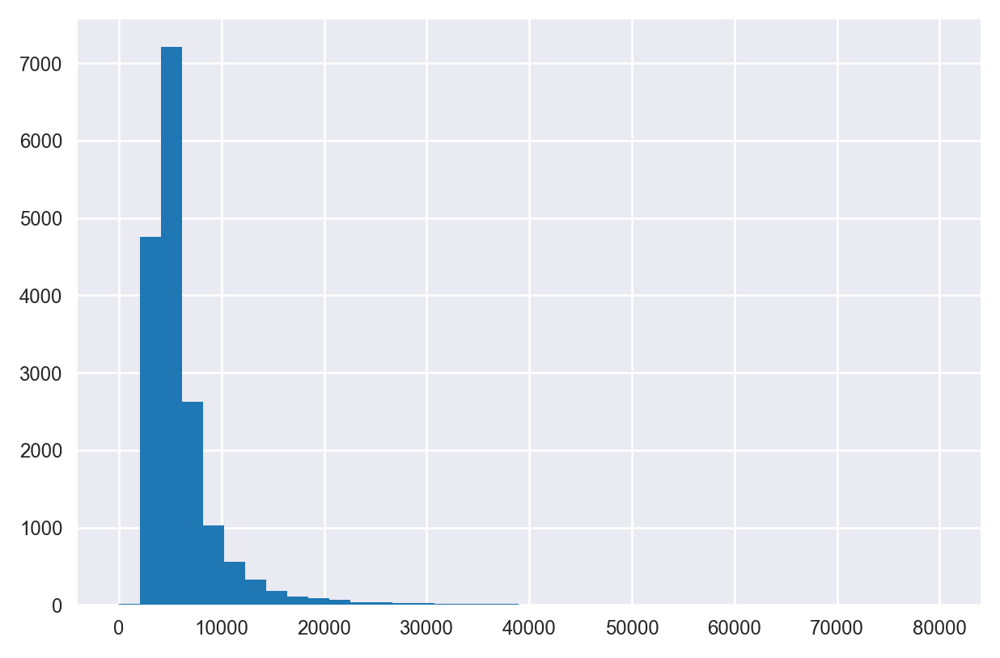

In [104]:
plt.hist(ends-starts, bins=np.linspace(0, 80000, 40));

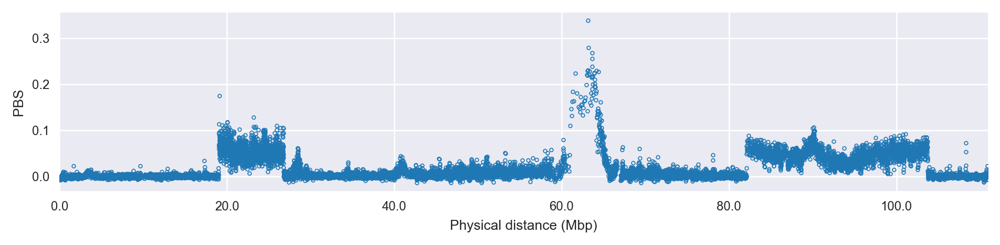

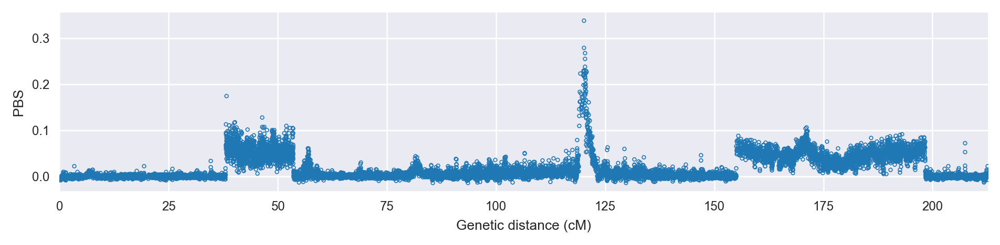

In [105]:
peakfit.plot_windowed_values(starts, ends, values, ylabel='PBS');
peakfit.plot_windowed_values(starts, ends, values, ylabel='PBS', gmap=gmap['2']);

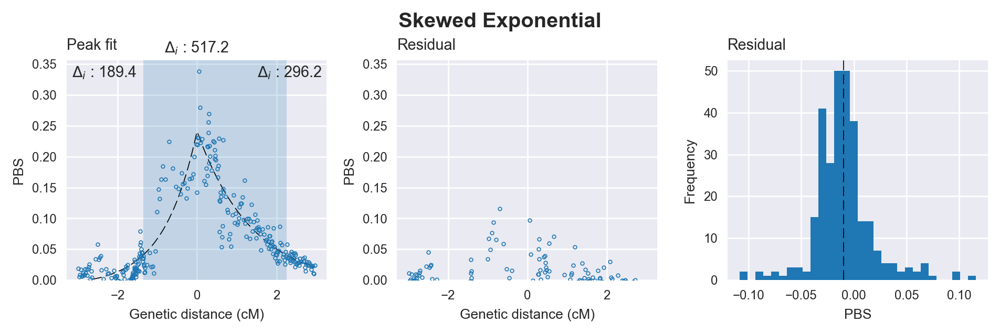

[[Model]]
    Model(skewed_exponential_peak)
[[Fit Statistics]]
    # function evals   = 38
    # data points      = 296
    # variables        = 4
    chi-square         = 0.233
    reduced chi-square = 0.001
    Akaike info crit   = -2107.199
    Bayesian info crit = -2092.437
[[Variables]]
    center:      0 (fixed)
    amplitude:   0.25122963 +/- 0.007156 (2.85%) (init= 0.2)
    decay:       1.08834661 +/- 0.092961 (8.54%) (init= 1)
    skew:       -0.36841296 +/- 0.037159 (10.09%) (init= 0)
    baseline:   -0.01001245 +/- 0.006967 (69.59%) (init= 0)
    ceiling:     1 (fixed)
    floor:      -1 (fixed)
[[Correlations]] (unreported correlations are <  0.100)
    C(decay, baseline)           = -0.926 
    C(amplitude, baseline)       = -0.573 
    C(skew, baseline)            = -0.362 
    C(decay, skew)               =  0.352 
    C(amplitude, skew)           =  0.345 
    C(amplitude, decay)          =  0.318 



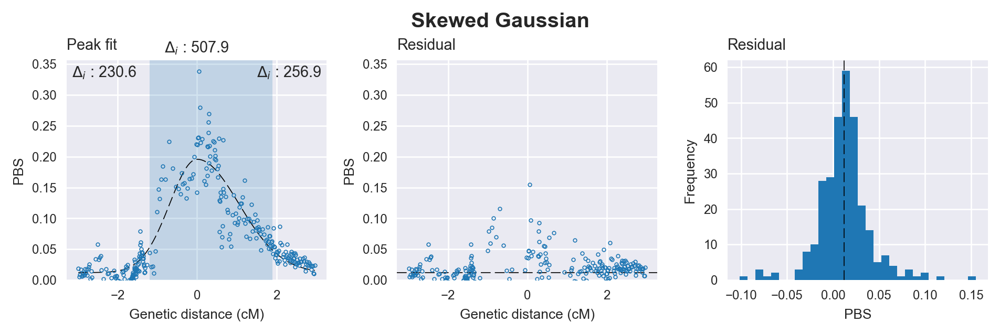

[[Model]]
    Model(skewed_gaussian)
[[Fit Statistics]]
    # function evals   = 48
    # data points      = 296
    # variables        = 4
    chi-square         = 0.241
    reduced chi-square = 0.001
    Akaike info crit   = -2097.914
    Bayesian info crit = -2083.152
[[Variables]]
    center:      0 (fixed)
    amplitude:   0.18378690 +/- 0.004979 (2.71%) (init= 0.2)
    sigma:       0.85240625 +/- 0.034231 (4.02%) (init= 1)
    skew:       -0.30885190 +/- 0.032765 (10.61%) (init= 0)
    baseline:    0.01198742 +/- 0.003552 (29.64%) (init= 0)
    ceiling:     1 (fixed)
    floor:      -1 (fixed)
[[Correlations]] (unreported correlations are <  0.100)
    C(sigma, baseline)           = -0.774 
    C(amplitude, baseline)       = -0.512 
    C(sigma, skew)               =  0.266 
    C(amplitude, skew)           =  0.179 
    C(skew, baseline)            = -0.170 
    C(amplitude, sigma)          =  0.133 



In [116]:
inspect_peak_fits(center=120, flank=3)

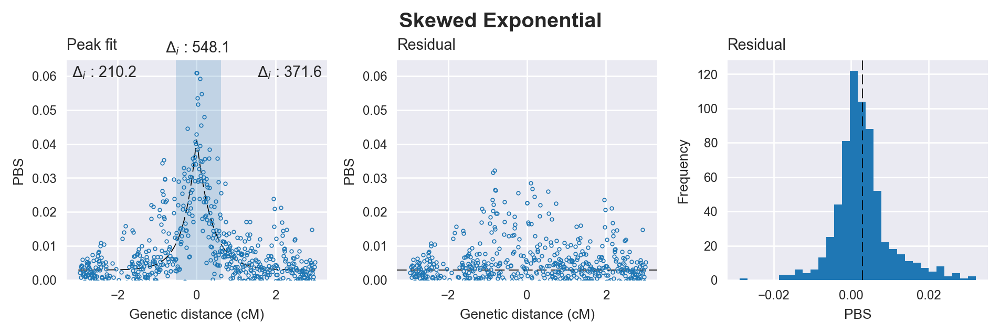

[[Model]]
    Model(skewed_exponential_peak)
[[Fit Statistics]]
    # function evals   = 53
    # data points      = 657
    # variables        = 4
    chi-square         = 0.033
    reduced chi-square = 0.000
    Akaike info crit   = -6486.784
    Bayesian info crit = -6468.833
[[Variables]]
    center:      0 (fixed)
    amplitude:   0.03872086 +/- 0.001583 (4.09%) (init= 0.2)
    decay:       0.35258830 +/- 0.024669 (7.00%) (init= 1)
    skew:       -0.11834962 +/- 0.059137 (49.97%) (init= 0)
    baseline:    0.00292584 +/- 0.000391 (13.36%) (init= 0)
    ceiling:     1 (fixed)
    floor:      -1 (fixed)
[[Correlations]] (unreported correlations are <  0.100)
    C(amplitude, decay)          = -0.576 
    C(decay, baseline)           = -0.564 



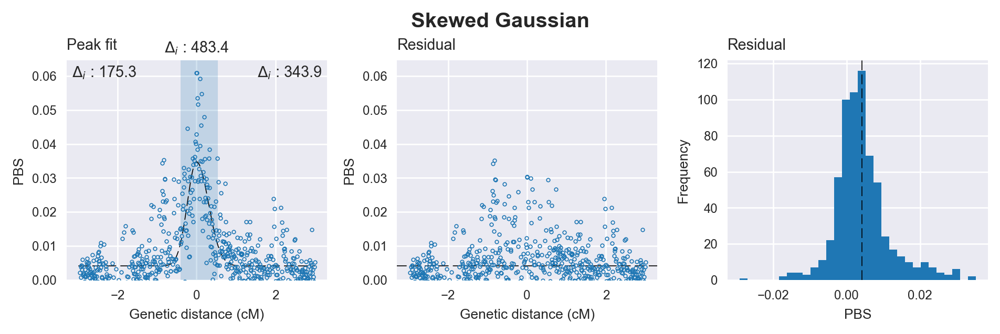

[[Model]]
    Model(skewed_gaussian)
[[Fit Statistics]]
    # function evals   = 103
    # data points      = 657
    # variables        = 4
    chi-square         = 0.037
    reduced chi-square = 0.000
    Akaike info crit   = -6422.161
    Bayesian info crit = -6404.210
[[Variables]]
    center:      0 (fixed)
    amplitude:   0.03061146 +/- 0.001272 (4.16%) (init= 0.2)
    sigma:       0.26460853 +/- 0.013081 (4.94%) (init= 1)
    skew:       -0.18238792 +/- 0.055398 (30.37%) (init= 0)
    baseline:    0.00414059 +/- 0.000339 (8.19%) (init= 0)
    ceiling:     1 (fixed)
    floor:      -1 (fixed)
[[Correlations]] (unreported correlations are <  0.100)
    C(amplitude, sigma)          = -0.476 
    C(sigma, baseline)           = -0.315 
    C(amplitude, baseline)       = -0.188 
    C(sigma, skew)               =  0.115 



In [115]:
inspect_peak_fits(center=56.9, flank=3)

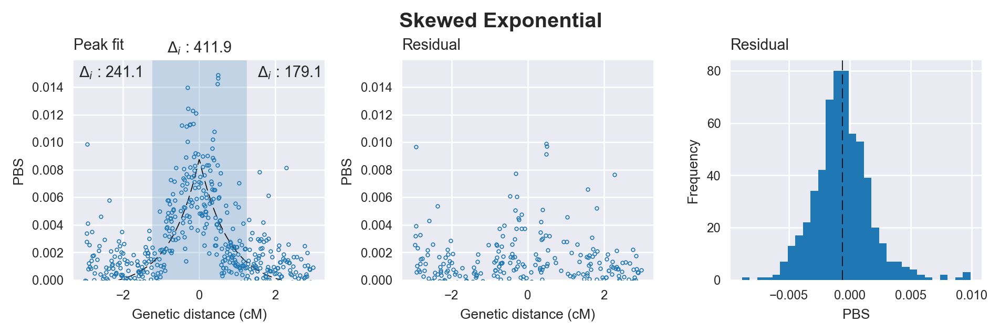

[[Model]]
    Model(skewed_exponential_peak)
[[Fit Statistics]]
    # function evals   = 48
    # data points      = 583
    # variables        = 4
    chi-square         = 0.003
    reduced chi-square = 0.000
    Akaike info crit   = -7059.762
    Bayesian info crit = -7042.290
[[Variables]]
    center:      0 (fixed)
    amplitude:   0.00938871 +/- 0.000389 (4.14%) (init= 0.2)
    decay:       0.77186033 +/- 0.084780 (10.98%) (init= 1)
    skew:       -0.01296762 +/- 0.058358 (450.03%) (init= 0)
    baseline:   -0.00060138 +/- 0.000261 (43.43%) (init= 0)
    ceiling:     1 (fixed)
    floor:      -1 (fixed)
[[Correlations]] (unreported correlations are <  0.100)
    C(decay, baseline)           = -0.848 
    C(amplitude, decay)          = -0.222 
    C(amplitude, baseline)       = -0.182 



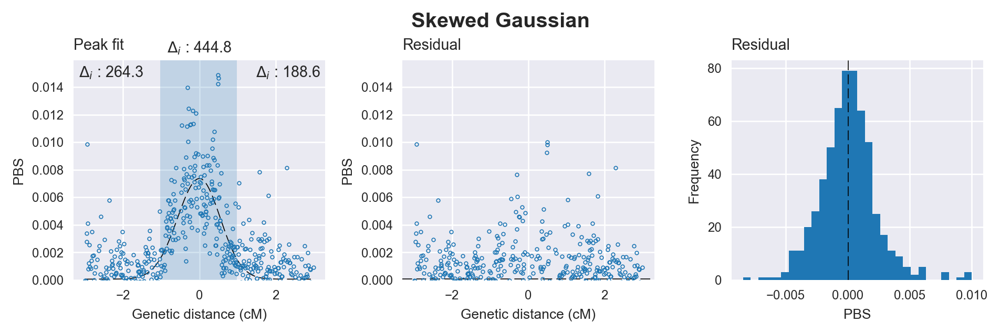

[[Model]]
    Model(skewed_gaussian)
[[Fit Statistics]]
    # function evals   = 53
    # data points      = 583
    # variables        = 4
    chi-square         = 0.003
    reduced chi-square = 0.000
    Akaike info crit   = -7092.737
    Bayesian info crit = -7075.265
[[Variables]]
    center:      0 (fixed)
    amplitude:   0.00730199 +/- 0.000293 (4.01%) (init= 0.2)
    sigma:       0.56088533 +/- 0.028589 (5.10%) (init= 1)
    skew:        0.03795045 +/- 0.051643 (136.08%) (init= 0)
    baseline:    6.1096e-05 +/- 0.000136 (222.23%) (init= 0)
    ceiling:     1 (fixed)
    floor:      -1 (fixed)
[[Correlations]] (unreported correlations are <  0.100)
    C(sigma, baseline)           = -0.514 
    C(amplitude, baseline)       = -0.331 
    C(amplitude, sigma)          = -0.295 



In [117]:
inspect_peak_fits(center=7, flank=3)

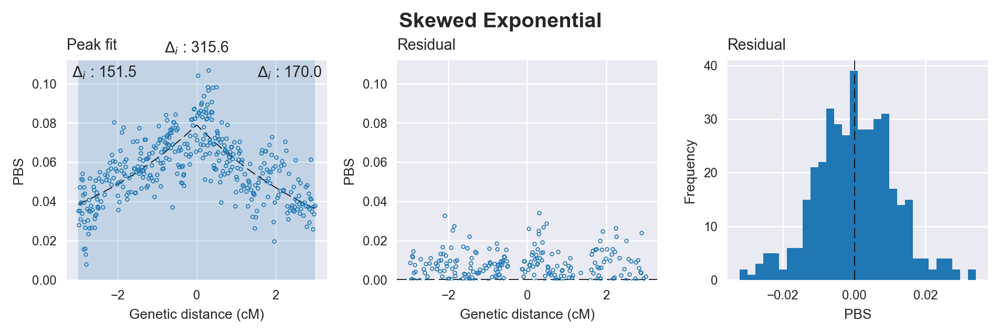

[[Model]]
    Model(skewed_exponential_peak)
[[Fit Statistics]]
    # function evals   = 77
    # data points      = 400
    # variables        = 4
    chi-square         = 0.049
    reduced chi-square = 0.000
    Akaike info crit   = -3595.773
    Bayesian info crit = -3579.807
[[Variables]]
    center:      0 (fixed)
    amplitude:   0.07880084 +/- 0.025380 (32.21%) (init= 0.2)
    decay:       3.99990350 +/- 1.931665 (48.29%) (init= 1)
    skew:        0.05494208 +/- 0.041783 (76.05%) (init= 0)
    baseline:    0.00017547 +/- 0.026570 (15142.61%) (init= 0)
    ceiling:     1 (fixed)
    floor:      -1 (fixed)
[[Correlations]] (unreported correlations are <  0.100)
    C(amplitude, baseline)       = -0.999 
    C(decay, baseline)           = -0.995 
    C(amplitude, decay)          =  0.990 



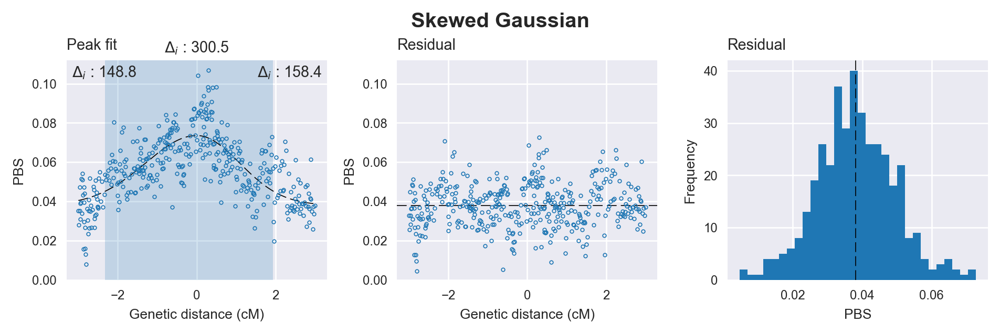

[[Model]]
    Model(skewed_gaussian)
[[Fit Statistics]]
    # function evals   = 58
    # data points      = 400
    # variables        = 4
    chi-square         = 0.051
    reduced chi-square = 0.000
    Akaike info crit   = -3580.653
    Bayesian info crit = -3564.687
[[Variables]]
    center:      0 (fixed)
    amplitude:   0.03553315 +/- 0.002048 (5.76%) (init= 0.2)
    sigma:       1.18405073 +/- 0.098601 (8.33%) (init= 1)
    skew:        0.12800916 +/- 0.048234 (37.68%) (init= 0)
    baseline:    0.03806049 +/- 0.002133 (5.61%) (init= 0)
    ceiling:     1 (fixed)
    floor:      -1 (fixed)
[[Correlations]] (unreported correlations are <  0.100)
    C(sigma, baseline)           = -0.873 
    C(amplitude, baseline)       = -0.842 
    C(amplitude, sigma)          =  0.584 
    C(sigma, skew)               = -0.117 



In [118]:
inspect_peak_fits(center=170.8, flank=3)

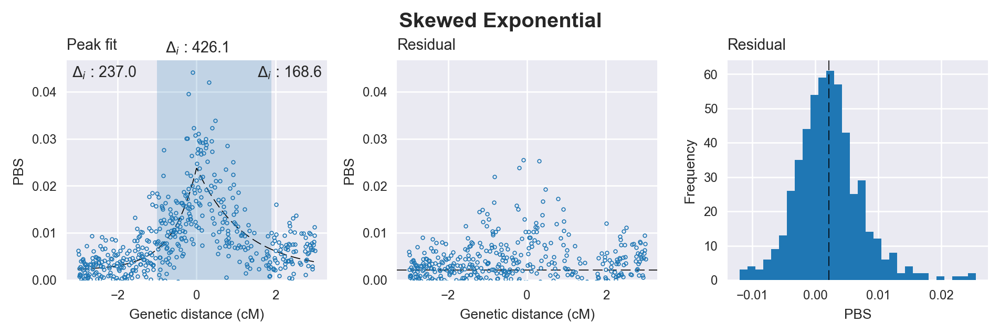

[[Model]]
    Model(skewed_exponential_peak)
[[Fit Statistics]]
    # function evals   = 33
    # data points      = 526
    # variables        = 4
    chi-square         = 0.014
    reduced chi-square = 0.000
    Akaike info crit   = -5522.043
    Bayesian info crit = -5504.982
[[Variables]]
    center:      0 (fixed)
    amplitude:   0.02166777 +/- 0.000842 (3.89%) (init= 0.2)
    decay:       0.86115395 +/- 0.083616 (9.71%) (init= 1)
    skew:       -0.45883939 +/- 0.060606 (13.21%) (init= 0)
    baseline:    0.00213978 +/- 0.000553 (25.84%) (init= 0)
    ceiling:     1 (fixed)
    floor:      -1 (fixed)
[[Correlations]] (unreported correlations are <  0.100)
    C(decay, baseline)           = -0.801 
    C(amplitude, baseline)       = -0.297 
    C(amplitude, decay)          = -0.161 
    C(skew, baseline)            = -0.142 



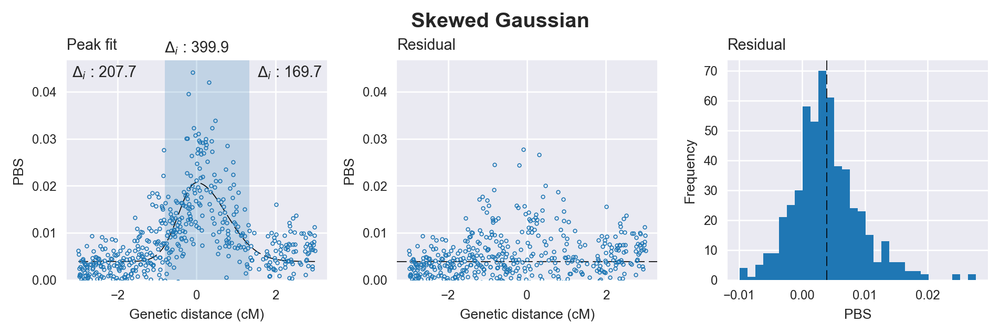

[[Model]]
    Model(skewed_gaussian)
[[Fit Statistics]]
    # function evals   = 73
    # data points      = 526
    # variables        = 4
    chi-square         = 0.015
    reduced chi-square = 0.000
    Akaike info crit   = -5495.827
    Bayesian info crit = -5478.765
[[Variables]]
    center:      0 (fixed)
    amplitude:   0.01675561 +/- 0.000698 (4.16%) (init= 0.2)
    sigma:       0.58357001 +/- 0.032036 (5.49%) (init= 1)
    skew:       -0.36402742 +/- 0.056804 (15.60%) (init= 0)
    baseline:    0.00392503 +/- 0.000335 (8.54%) (init= 0)
    ceiling:     1 (fixed)
    floor:      -1 (fixed)
[[Correlations]] (unreported correlations are <  0.100)
    C(sigma, baseline)           = -0.489 
    C(amplitude, baseline)       = -0.361 
    C(amplitude, sigma)          = -0.287 



In [119]:
inspect_peak_fits(center=81.6, flank=3)